In [1]:
#notes: 
# 1. dataframe.columns - the label for the columns
# 2. df[col].fillna(0, inplace = True) - replaces the column null value with 0
# 3. is_numeric_dtype(df['column name']) - checks if the column is numeric 
#       (INCLUDE LIB from pandas.api.types import is_numeric_dtype)
#    or if( df['col_name'].dtype ='int64')
# 4. pd.set_option('display.max_rows',None )
# 5. regular expressions to manipulate string columns 
#    df["released_year"]=df["released"].str.replace('\s\([a-zA-Z\s]*\)', ' ',regex=True).str.strip()

#import libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')

%matplotlib inline
matplotlib.rcParams['figure.figsize'] =(12,8)
from pandas.api.types import is_numeric_dtype



In [2]:
df=pd.read_csv(r'D:\Users\CJosep15\OneDrive - JNJ\Desktop\Tableau Res\Data Sets\movies.csv')

In [3]:
df.head()


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
#checking for missing data




for col in df.columns:
    prct_missing = np.mean(df[col].isnull())
    print('{}={}%'.format(col,prct_missing))

name=0.0%
rating=0.010041731872717789%
genre=0.0%
year=0.0%
released=0.0002608242044861763%
score=0.0003912363067292645%
votes=0.0003912363067292645%
director=0.0%
writer=0.0003912363067292645%
star=0.00013041210224308815%
country=0.0003912363067292645%
budget=0.2831246739697444%
gross=0.02464788732394366%
company=0.002217005738132499%
runtime=0.0005216484089723526%


In [5]:
#drop those rows which have nulls for budget gross and released date
df=df.dropna(subset=['released', 'budget', 'gross']) 

In [6]:
# result after removing those rows with nulls for budget, gross and release date
for col in df.columns:
    prct_missing = np.mean(df[col].isnull())
    print('{}={}%'.format(col,prct_missing))

name=0.0%
rating=0.002207505518763797%
genre=0.0%
year=0.0%
released=0.0%
score=0.0%
votes=0.0%
director=0.0%
writer=0.0%
star=0.0%
country=0.0001839587932303164%
budget=0.0%
gross=0.0%
company=0.0003679175864606328%
runtime=0.0001839587932303164%


In [7]:
# replace null with NA string columns and 0 for numeric columns

# 1. check datatype
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [8]:
#2. Replace the values
for col in df.columns:
    if (is_numeric_dtype(df[col])):
        df[col].fillna(0, inplace = True)
    else:
        df[col].fillna("N/A", inplace = True)

In [9]:
# result after cleaning data
for col in df.columns:
    prct_missing = np.mean(df[col].isnull())
    print('{}={}%'.format(col,prct_missing))

name=0.0%
rating=0.0%
genre=0.0%
year=0.0%
released=0.0%
score=0.0%
votes=0.0%
director=0.0%
writer=0.0%
star=0.0%
country=0.0%
budget=0.0%
gross=0.0%
company=0.0%
runtime=0.0%


In [10]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000.0,426505244.0,Columbia Pictures,124.0
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000.0,319715683.0,Paramount Pictures,99.0
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000.0,245487753.0,Universal Pictures,101.0
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000.0,111105497.0,20th Century Studios,100.0


In [11]:
#change data type of budget and gross to integer
df["budget"] = df["budget"].astype('int64')
df["gross"] = df["gross"].astype('int64')

In [12]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.0
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.0
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.0
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.0


In [96]:

import re
df["released_year"]=df["released"].str.replace('\s\([a-zA-Z\s]*\)', ' ',regex=True).str.strip()
df["released_year"]=df["released_year"].str[-4:]
df["released_year"]=df["released_year"].str.strip()

In [95]:

df.sort_values(by = "gross", inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2434,Philadelphia Experiment II,PG-13,Action,1993,"June 4, 1994 (South Korea)",4.5,1900.0,Stephen Cornwell,Wallace C. Bennett,Brad Johnson,United States,5000000,2970,Trimark Pictures,97.0,1994
3681,Ginger Snaps,Not Rated,Drama,2000,"May 11, 2001 (Canada)",6.8,43000.0,John Fawcett,Karen Walton,Emily Perkins,Canada,5000000,2554,Copperheart Entertainment,108.0,2001
272,Parasite,R,Horror,1982,"March 12, 1982 (United States)",3.9,2300.0,Charles Band,Alan J. Adler,Robert Glaudini,United States,800000,2270,Embassy Pictures,85.0,1982
2417,Madadayo,N/A,Drama,1993,"April 17, 1993 (Japan)",7.3,5100.0,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment,134.0,1993


In [106]:
pd.set_option('display.max_rows',None )
df=df.sort_values(by = "gross", inplace = False, ascending = False)

In [107]:
# find duplicate rows
df.duplicated(keep='last')
#drop duplicates
df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019


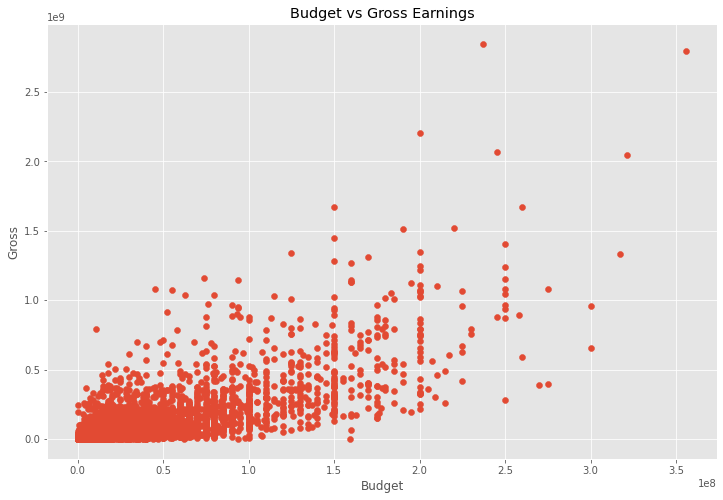

In [111]:

plt.scatter(x=df['budget'],y=df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Budget')
plt.ylabel('Gross')
plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

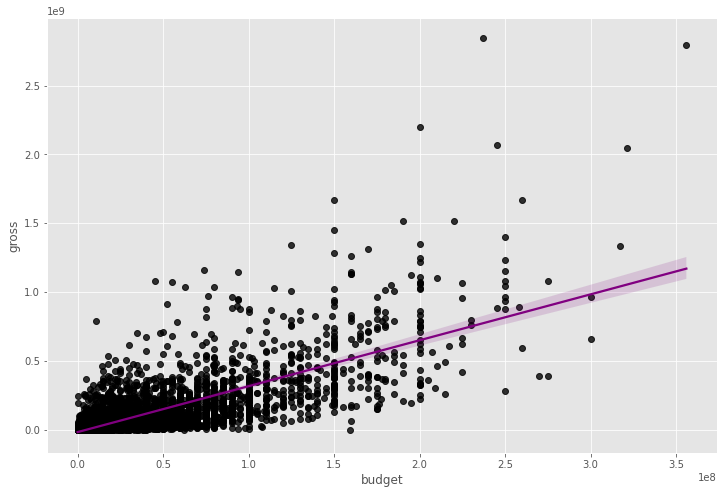

In [113]:
sns.regplot(x='budget', y='gross', data= df, scatter_kws={"color": "black"},line_kws={"color":"purple"})

In [122]:
df.corr(method = 'pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.055174,0.205758,0.327781,0.274264,0.072880
score,0.055174,1.000000,0.473809,0.071792,0.222143,0.414420
votes,0.205758,0.473809,1.000000,0.440021,0.614904,0.351721
budget,0.327781,0.071792,0.440021,1.000000,0.740395,0.317449
gross,0.274264,0.222143,0.614904,0.740395,1.000000,0.275074
runtime,0.072880,0.414420,0.351721,0.317449,0.275074,1.000000


In [115]:
df.corr(method = 'kendall')

,year,score,votes,budget,gross,runtime
year,1.000000,0.038391,0.295884,0.220991,0.239313,0.063861
score,0.038391,1.000000,0.350111,-0.006518,0.124715,0.293052
votes,0.295884,0.350111,1.000000,0.346228,0.553640,0.205591
budget,0.220991,-0.006518,0.346228,1.000000,0.512637,0.230628
gross,0.239313,0.124715,0.553640,0.512637,1.000000,0.176754
runtime,0.063861,0.293052,0.205591,0.230628,0.176754,1.000000


In [116]:
df.corr(method = 'spearman')

,year,score,votes,budget,gross,runtime
year,1.000000,0.056269,0.426571,0.313199,0.350679,0.094046
score,0.056269,1.000000,0.495379,-0.010133,0.182857,0.413286
votes,0.426571,0.495379,1.000000,0.493404,0.745815,0.300940
budget,0.313199,-0.010133,0.493404,1.000000,0.693670,0.329917
gross,0.350679,0.182857,0.745815,0.693670,1.000000,0.257036
runtime,0.094046,0.413286,0.300940,0.329917,0.257036,1.000000


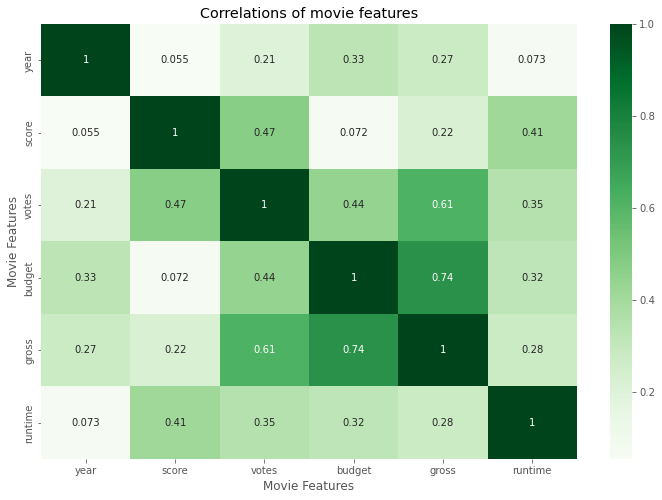

In [121]:
correlation=df.corr(method = 'pearson')

sns.heatmap(correlation, annot=True, cmap='Greens')
plt.title('Correlations of movie features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()


In [125]:
df_numerized = df
for col_nm in df_numerized.columns:
    if(df_numerized[col_nm].dtype =='object'):
        df_numerized[col_nm]= df_numerized[col_nm].astype('category')
        df_numerized[col_nm] = df_numerized[col_nm].cat.codes
            
df_numerized          

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
5445,387,6,0,2009,528,7.8,1100000.0,787,1265,1538,48,237000000,2847246203,1389,162.0,29
7445,389,6,0,2019,138,8.4,903000.0,106,515,1474,48,356000000,2797501328,987,181.0,39
3045,4923,6,6,1997,535,7.8,1100000.0,787,1265,1076,48,200000000,2201647264,1389,194.0,17
6663,3656,6,0,2015,530,7.8,876000.0,770,1810,357,48,245000000,2069521700,949,138.0,35
7244,390,6,0,2018,146,8.4,897000.0,106,515,1474,48,321000000,2048359754,987,149.0,38
7480,4402,5,2,2019,1130,6.9,222000.0,1014,1364,458,48,260000000,1670727580,1430,118.0,39
6653,2125,6,0,2015,1307,7.0,593000.0,337,2530,294,48,150000000,1670516444,1404,124.0,35
6043,3891,6,0,2012,1905,8.0,1300000.0,1062,1650,1474,48,220000000,1518815515,987,143.0,32
6646,1545,6,0,2015,166,7.1,370000.0,811,483,1792,48,190000000,1515341399,1404,137.0,35
7494,1534,5,2,2019,2059,6.8,148000.0,279,1386,1039,48,150000000,1450026933,1429,103.0,39


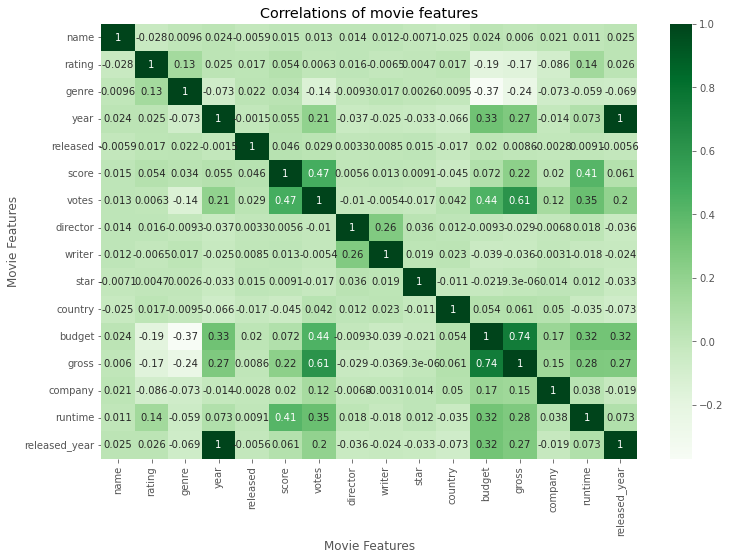

In [126]:
correlation=df_numerized.corr(method = 'pearson')

sns.heatmap(correlation, annot=True, cmap='Greens')
plt.title('Correlations of movie features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()
